# Поиск изображений по текстовому запросу

Вам поручено разработать демонстрационную версию поиска изображений по текстовому запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные лежат в папке `/datasets/image_search/`.

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 0. Импорт библиотек и подготовка окружения

In [ ]:
!pip install -q transformers
!pip install -q git+https://github.com/openai/CLIP.git

     |████████████████████████████████| 5.5 MB 7.8 MB/s 
     |████████████████████████████████| 182 kB 64.7 MB/s 
     |████████████████████████████████| 7.6 MB 54.9 MB/s 
     |████████████████████████████████| 53 kB 1.5 MB/s 


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import transformers as tfs
import random
import pickle
from tqdm import tqdm, notebook
import clip
import torch
import torch.nn as nn
from torch import cuda
from torch.autograd import Variable
from torch.utils.data import DataLoader, Dataset
from PIL import Image
from torchvision import datasets, transforms, models
import helper
import os
from skimage import io, transform
from sklearn.model_selection import GroupShuffleSplit
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.metrics import roc_auc_score, mean_absolute_error, mean_squared_error
from torch.utils.data import Dataset, TensorDataset
from torch.utils.data import DataLoader
from scipy.spatial.distance import cosine

In [ ]:
PATH = '/content/drive/MyDrive/y_practikum_sborny_4'
device = torch.device("cuda") if torch.cuda.is_available() else torch.device('cpu')

# Зафиксируем random seed
random.seed(0)
np.random.seed(0)
torch.manual_seed(0)
torch.cuda.manual_seed(0)

tfs.utils.logging.disable_progress_bar()

In [ ]:
def save_to_pkl(data, file_name):
    with open(f'{PATH}/{file_name}.pkl', 'wb') as f:
          pickle.dump(data, f)
    print(f'Saved to {PATH}/{file_name}.pkl')

def load_from_pkl(file_name):
    loaded_data = pickle.load(open(f'{PATH}/{file_name}.pkl', 'rb'))
    return loaded_data

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи мы должны эти оценки агрегировать — превратить в одну. Модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.  

В файле с краудсорсинговыми оценками информация расположена в таком порядке: 

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке. 
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

### 1.1 Обзор данных

Загрузим данные и посмотрим на них.

In [ ]:
train_dataset = pd.read_csv(f'{PATH}/train_dataset.csv')
test_images = pd.read_csv(f'{PATH}/test_images.csv')
test_queries = pd.read_csv(f'{PATH}/test_queries.csv', sep='|', index_col=0)

expert_annotations = pd.read_csv(f'{PATH}/ExpertAnnotations.tsv', delimiter='\t', header=None)
expert_annotations.columns = ['image', 'query_id', 'exp_1', 'exp_2', 'exp_3']
crowd_annotations = pd.read_csv(f'{PATH}/CrowdAnnotations.tsv', delimiter='\t', header=None)
crowd_annotations.columns = ['image', 'query_id', 'conf_rate', 'confirm', 'not_confirm']

In [ ]:
# Функция выводит необходимую информацию о данных
def show_info_about(dataset):
  print(dataset.info())
  display(dataset.head())

In [ ]:
# Тренирововчный набор данных
show_info_about(train_dataset)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
None


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


In [ ]:
# Название тестовых изображений
show_info_about(test_images)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes
None


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [ ]:
# Тестовый набор данных
show_info_about(test_queries)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
None


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [ ]:
# Экспертные оценки (expert_annotations)
show_info_about(expert_annotations)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   exp_1     5822 non-null   int64 
 3   exp_2     5822 non-null   int64 
 4   exp_3     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB
None


,image,query_id,exp_1,exp_2,exp_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [ ]:
expert_annotations.describe()

,exp_1,exp_2,exp_3
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


Для расчета аггрегированной оценки экспертов, возмем медианную оценку всех экспертов. Перед этим вычтем из всех оденок единицу, для того, чтобы оценки лежали в диапазоне от 0 до 3. Таким образом оценка 0 будет означать, что эксперт посчитал, что описание совершенно не соответствует изображению.  
После этого поделим каждую оценку на 3. Таким образом, мы разложим оценки экспертов на отрезок от нуля до единицы.

In [ ]:
expert_annotations['exp_total'] = (expert_annotations[['exp_1', 'exp_2', 'exp_3']] - 1).median(axis=1)
expert_annotations['exp_total_rate'] = expert_annotations['exp_total'] / 3

Посмотрим на количество уникальных сочетаний картинка+описание для `train_dataset` и `expert_annotations`, а также на то, одинаковы ли данные сочетания для обеих выборок.

In [ ]:
print('Количество уникальных сочетаний картинку+описание в train_dataset:', len(np.unique([val[0] + val[1] for val in expert_annotations[['image', 'query_id']].values])))
print('Количество уникальных сочетаний картинку+описание в expert_annotations:', len(np.unique([val[0] + val[1] for val in train_dataset[['image', 'query_id']].values])))
print('Сочетания картинка+описание одинковы для train_dataset и expert_annotations:', \
      set(np.unique([val[0] + val[1] for val in expert_annotations[['image', 'query_id']].values])) \
      == set(np.unique([val[0] + val[1] for val in train_dataset[['image', 'query_id']].values])))

Количество уникальных сочетаний картинку+описание в train_dataset: 5822
Количество уникальных сочетаний картинку+описание в expert_annotations: 5822
Сочетания картинка+описание одинковы для train_dataset и expert_annotations: True


In [ ]:
# Оценки толпы (crowd_annotations)
show_info_about(crowd_annotations)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   image        47830 non-null  object 
 1   query_id     47830 non-null  object 
 2   conf_rate    47830 non-null  float64
 3   confirm      47830 non-null  int64  
 4   not_confirm  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
None


,image,query_id,conf_rate,confirm,not_confirm
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [ ]:
crowd_annotations.describe()

,conf_rate,confirm,not_confirm
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


Посмотрим, давали ли респонеднтам одно и то же сочетание изображения и описания несколько раз.

In [ ]:
(crowd_annotations.groupby(['image', 'query_id'])['conf_rate'].count() > 1).sum()

0

**Нет**, каждой изображение было дано с каждым описанием лишь единожды.

In [ ]:
print("Количество уникальных изображений в test_queries", test_queries.image.nunique())
print("Уникальные изображения из test_queries и test_images сопадают:", set(test_queries.image.unique()) == set(test_images.image.unique()))

Количество уникальных изображений в test_queries 100
Уникальные изображения из test_queries и test_images сопадают: True


In [ ]:
print("Количество уникальных изображений в train_dataset", train_dataset.image.nunique())
print("Количество уникальных изображений в expert_annotations:", expert_annotations.image.nunique())
print("Количество уникальных изображений в crowd_annotations:", crowd_annotations.image.nunique())
print("Уникальные изображения из train_dataset, expert_annotations и crowd_annotations сопадают:",\
      set(train_dataset.image.unique()) == set(expert_annotations.image.unique()) == set(crowd_annotations.image.unique()))

Количество уникальных изображений в train_dataset 1000
Количество уникальных изображений в expert_annotations: 1000
Количество уникальных изображений в crowd_annotations: 1000
Уникальные изображения из train_dataset, expert_annotations и crowd_annotations сопадают: True


In [ ]:
print("Количество уникальных запросов (query_id) в train_dataset:", train_dataset.query_id.nunique())
print("Количество уникальных запросов (query_id) в expert_annotations:", expert_annotations.query_id.nunique())
print("Количество уникальных запросов (query_id) в crowd_annotations:", crowd_annotations.query_id.nunique())

Количество уникальных запросов (query_id) в train_dataset: 977
Количество уникальных запросов (query_id) в expert_annotations: 977
Количество уникальных запросов (query_id) в crowd_annotations: 1000


In [ ]:
print("Уникальные запросы (query_id) из train_dataset и expert_annotations совпадают:", set(train_dataset.query_id.unique()) == set(expert_annotations.query_id.unique()))

Уникальные запросы (query_id) из train_dataset и expert_annotations совпадают: True


Получается, что в `crowd_annotations` присутствует 23 описания, для которых нет текстового описания:

In [ ]:
queries_without_descr = set(crowd_annotations.query_id.unique()) - set(train_dataset.query_id.unique())
queries_without_descr

{'1343426964_cde3fb54e8.jpg#2',
 '2054869561_ff723e9eab.jpg#2',
 '2194494220_bb2178832c.jpg#2',
 '223299142_521aedf9e7.jpg#2',
 '2431832075_00aa1a4457.jpg#2',
 '2479162876_a5ce3306af.jpg#2',
 '2482629385_f370b290d1.jpg#2',
 '2806710650_e201acd913.jpg#2',
 '2913965136_2d00136697.jpg#2',
 '3015863181_92ff43f4d8.jpg#2',
 '3019842612_8501c1791e.jpg#2',
 '3116769029_f5a76f04ba.jpg#2',
 '3149919755_f9272b10b3.jpg#2',
 '3185371756_ff4e9fa8a6.jpg#2',
 '3203453897_6317aac6ff.jpg#2',
 '3349451628_4249a21c8f.jpg#2',
 '3375549004_beee810e60.jpg#2',
 '3387542157_81bfd00072.jpg#2',
 '3427118504_93126c83e0.jpg#2',
 '3499720588_c32590108e.jpg#2',
 '3521374954_37371b49a4.jpg#2',
 '3523559027_a65619a34b.jpg#2',
 '86412576_c53392ef80.jpg#2'}

С данными описаниями мы работать не сможем, так как для них нет текстового представления в датасете `train_dataset`

In [ ]:
print("Количество уникальных сочетаний запросов (query_id) и изображений в train_dataset:", \
      len(set([el[0] + el[1] for el in train_dataset[['query_id', 'image']].values])))
print("Количество уникальных сочетаний запросов (query_id) и изображений в expert_annotations:", \
      len(set([el[0] + el[1] for el in expert_annotations[['query_id', 'image']].values])))
print("Количество уникальных сочетаний запросов (query_id) и изображений в crowd_annotations:", \
      len(set([el[0] + el[1] for el in crowd_annotations[['query_id', 'image']].values])))

Количество уникальных сочетаний запросов (query_id) и изображений в train_dataset: 5822
Количество уникальных сочетаний запросов (query_id) и изображений в expert_annotations: 5822
Количество уникальных сочетаний запросов (query_id) и изображений в crowd_annotations: 47830


### 1.2 Объединение таблиц

На данном этапе соеденим таблицу с тренировочным датасетом и оценками экспертов.

In [ ]:
train_data_big = train_dataset\
.merge(expert_annotations[['image', 'query_id', 'exp_total_rate']], how='left', on=['image', 'query_id'])\
.merge(crowd_annotations[['image', 'query_id', 'conf_rate']], how='outer', on=['image', 'query_id'])

query_id_text_corresp = train_dataset[['query_id', 'query_text']].drop_duplicates()

train_data_big = train_data_big.drop(columns=['query_text']).merge(query_id_text_corresp, how="left", on=['query_id'])
train_data_big = train_data_big[~train_data_big['query_id'].isin(queries_without_descr)].drop('query_id', axis=1)

In [ ]:
train_data_big.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           50214 non-null  object 
 1   exp_total_rate  5822 non-null   float64
 2   conf_rate       46721 non-null  float64
 3   query_text      50214 non-null  object 
dtypes: float64(2), object(2)
memory usage: 1.9+ MB


Будем полагать, что экспертные оценки 1 и ниже (0.33 и ниже) обозначают скорее несоотвествие описания изображению, а оценки 2 и выше (0.66 и выше) - скорее соотвествие. Таким образом, можно сказать, что в столбце `exp_total_rate` у нас хранится степень соответствия описания картинке.  
При этом, долю респондентов, которые оценили описание как соответствующее изображению (`conf_rate`), мы тоже можем в некотором смысле назвать степенью соответствия описания картинке.   
Для формирования итоговой оценки, возмем среднее арифметическое этих двух оценок.

In [ ]:
train_data_big['target'] = train_data_big[['conf_rate', 'exp_total_rate']].mean(axis=1)
train_data_big = train_data_big.drop(columns=['conf_rate', 'exp_total_rate'])

In [ ]:
train_data_big['target'].describe()

count    50214.000000
mean         0.074973
std          0.207215
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: target, dtype: float64

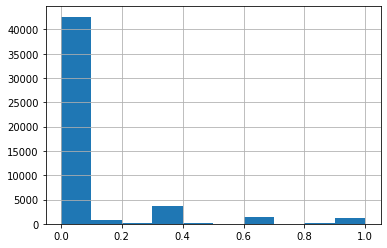

In [ ]:
train_data_big['target'].hist();

Итого, в соответствии с текущей разметкой, большинство изображений не соотвествуют описанию.

Посмотрим на изображения и их описания

In [ ]:
sample_data = train_data_big.sample(n=5000, random_state=0)
negative = sample_data[sample_data['target'] <= 0.5]
positive = sample_data[sample_data['target'] > 0.5]

In [ ]:
# Функция, которая разделяет любую строку на основе определенного символа (возвращая его вместе со строкой), с максимальным количеством слов в ней
def split_title_line(title_text, split_on='(', max_words=5):
    """
    A function that splits any string based on specific character
    (returning it with the string), with maximum number of words on it
    """
    split_at = title_text.find (split_on)
    ti = title_text
    if split_at > 1:
        ti = ti.split (split_on)
        for i, tx in enumerate (ti[1:]):
            ti[i + 1] = split_on + tx
    if type (ti) == type ('text'):
        ti = [ti]
    for j, td in enumerate (ti):
        if td.find (split_on) > 0:
            pass
        else:
            tw = td.split ()
            t2 = []
            for i in range (0, len (tw), max_words):
                t2.append (' '.join (tw[i:max_words + i]))
            ti[j] = t2
    ti = [item for sublist in ti for item in sublist]
    ret_tex = []
    for j in range (len (ti)):
        for i in range(0, len(ti)-1, 2):
            if len (ti[i].split()) + len (ti[i+1].split ()) <= max_words:
                mrg = " ".join ([ti[i], ti[i+1]])
                ti = [mrg] + ti[2:]
                break

    if len (ti[-2].split ()) + len (ti[-1].split ()) <= max_words:
        mrg = " ".join ([ti[-2], ti[-1]])
        ti = ti[:-2] + [mrg]
    return '\n'.join (ti)

Посмотрим на изображения, которым подобрано соотвествующее описание.

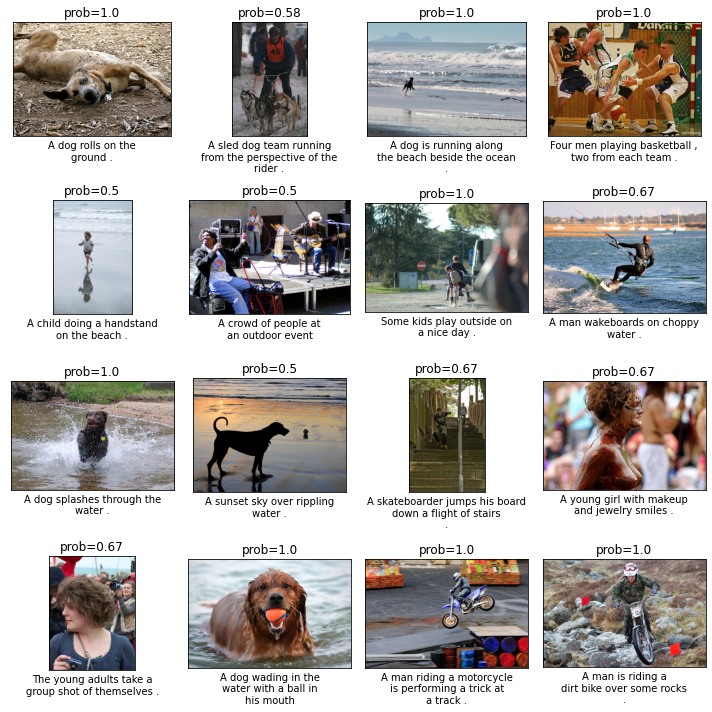

In [ ]:
fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    img_name = positive.iloc[i]['image']
    img_text = positive.iloc[i]['query_text']
    img_target = positive.iloc[i]['target']
    img = mpimg.imread(f'{PATH}/train_images/{img_name}')
    plt.imshow(img)
    plt.title(f'prob={round(img_target, 2)}')
    plt.xlabel(split_title_line(img_text))
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Посмотрим также на изображения, которым подобрано несоотвествующее описание.

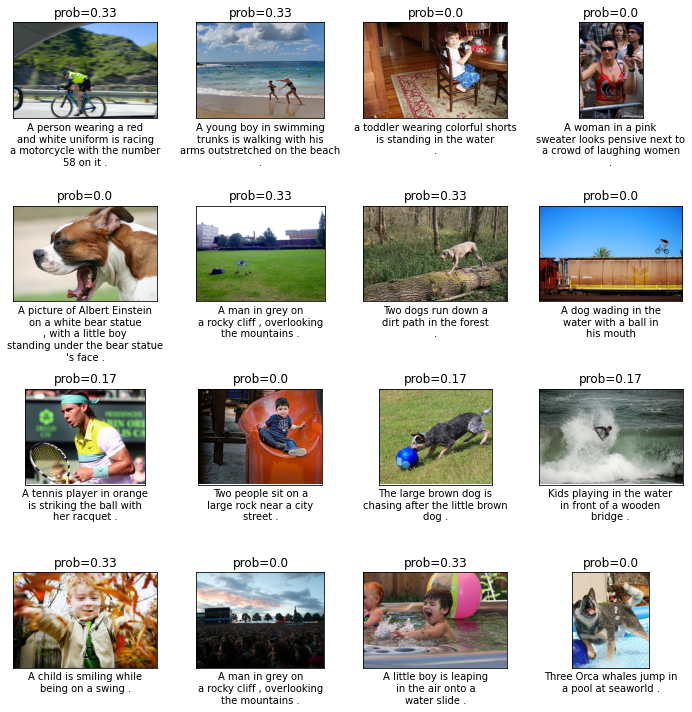

In [ ]:
fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    img_name = negative.iloc[i]['image']
    img_text = negative.iloc[i]['query_text']
    img_target = negative.iloc[i]['target']
    img = mpimg.imread(f'{PATH}/train_images/{img_name}')
    plt.imshow(img)
    plt.title(f'prob={round(img_target, 2)}')
    plt.xlabel(split_title_line(img_text))
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

В целом, оценка соотвествия описания изображению правдоподобна.

## 2. Проверка данных

**Условие задачи**: в некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
> 

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Создадим список слов которые, могут попадать под юридические ограничения.

In [ ]:
prohibit_wordlist = ['girl', 'boy', 'child', 'children', 'baby', 'young', 'teen', 'teenager']

Создадим функцию, которая:
- Принимает на вход строку
- На выходе возвращает:
  - NaN: если текст содержит запрещенные слова
  - Изначальную строку: если текст не содержит запрещенные слова


In [ ]:
def delete_prohib_words(string, prohibit_wordlist):
    prohibit_wordlist = prohibit_wordlist
    lst = string.split(' ')
    if len(set(lst).intersection(set(prohibit_wordlist))) != 0:
        res = np.nan
    else:
        res = string
    return res

Создадим булевый фильтр, который отмечает меткой True строки, НЕ содержащие запрещенный контент:

In [ ]:
prohibit_wordlist_filter_big = train_data_big['query_text'].apply(lambda x: delete_prohib_words(x, prohibit_wordlist)).notna()

Применим фильтр к датасету `train_data` и сохраним очищенный датасет в переменную `train_data_big_clear`: 

In [ ]:
train_data_big_clear = train_data_big[prohibit_wordlist_filter_big]
print('Количество объектов в очищенном от запрещенных слов датасете:', train_data_big_clear.shape[0])

Количество объектов в очищенном от запрещенных слов датасете: 38589


## 3. Векторизация изображений

Перейдём к векторизации изображений. Обратимся к сверточным сетям: они позволят "выделить" главные компоненты изображений. 

In [ ]:
train_data_big_clear.head()

,image,query_text,target
22,1056338697_4f7d7ce270.jpg,A man sleeps under a blanket on a city street .,0.000000
23,3187395715_f2940c2b72.jpg,A man sleeps under a blanket on a city street .,0.333333
24,463978865_c87c6ca84c.jpg,A man sleeps under a blanket on a city street .,0.166667
25,488590040_35a3e96c89.jpg,A man sleeps under a blanket on a city street .,0.333333
26,534875358_6ea30d3091.jpg,A man sleeps under a blanket on a city street .,0.000000


Приведем изображение в нужный формат. Изменим размер картинки, обрежем центр и нормализуем. Преобразуем изображения в текст с использованием предобученной модели ResNet18.

In [ ]:
def resnet_image_to_tensor(image_names, data_set):
    """
    Convert image to tensor
    """
    # Загрузим модель "resnet" с предобученными параметрами
    resnet = models.resnet18(pretrained=True)
    # Заморозим веса
    for param in resnet.parameters():
        param.requires_grad_(False)

    # Удалим "голову" модели и сохраним оставшиеся слои в переменную "resnet"
    modules = list(resnet.children())[:-1]
    resnet = nn.Sequential(*modules).to(device)

    # Переведем модель в режим предсказания
    resnet.eval();

    output_vectors = []
    images_names_list = image_names.values
    preprocess = transforms.Compose([
      transforms.Resize(256),
      transforms.CenterCrop(224),
      transforms.ToTensor(),
      transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    if data_set == 'train':
        folder = 'train_images'
    elif data_set == 'test':
    folder = 'test_images'

    for img_name in images_names_list:
        img = Image.open(f"{PATH}/{folder}/{img_name}").convert('RGB')
        image_tensor = preprocess(img).unsqueeze(0)
        output_tensor = resnet(image_tensor.to(device)).flatten()
        output_vectors.append(output_tensor.cpu().numpy())
        torch.cuda.empty_cache()
    return np.array(output_vectors)

In [ ]:
try:
    train_images_vectors_big = load_from_pkl('train_images_vectors_big')
except:
    train_images_vectors_big = resnet_image_to_tensor(image_names=train_data_big_clear['image'], data_set='train')
#   save_to_pkl(train_images_vectors_big, 'train_images_vectors_big')
  
train_images_vectors_big.shape

(38589, 512)

## 4. Векторизация текстов

Следующий этап — векторизация текстов.


In [ ]:
def bert_text_to_vectors(texts_series):
    tokenizer = tfs.DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
    model = tfs.DistilBertModel.from_pretrained('distilbert-base-uncased')
    model.to(device)

    tokenized = texts_series.apply(lambda x: tokenizer.encode(x, add_special_tokens=True, truncation=True))

    max_len = 0
    for i in tokenized.values:
    if len(i) > max_len:
        max_len = len(i)

    padded = np.array([i + [0]*(max_len-len(i)) for i in tokenized.values])
    attention_mask = np.where(padded != 0, 1, 0)

    input_ids = torch.tensor(padded).to(device)
    attention_mask = torch.tensor(attention_mask).to(device)
    batch_size = 100
    embeddings = []

    for i in range(input_ids.shape[0] // batch_size + 1):
        batch = input_ids[batch_size*i:batch_size*(i+1)]
        attention_mask_batch = attention_mask[batch_size*i:batch_size*(i+1)]

        with torch.no_grad():
            batch_embeddings = model(batch, attention_mask=attention_mask_batch)

        embeddings.append(batch_embeddings[0][:,0,:].cpu().numpy())
        torch.cuda.empty_cache()

    features = np.concatenate(embeddings)
    return features

In [ ]:
try:
    train_text_vectors_big = load_from_pkl('train_text_vectors_big')
except:
    train_text_vectors_big = bert_text_to_vectors(train_data_big_clear['query_text'])
#   save_to_pkl(train_text_vectors_big, 'train_text_vectors_big')

train_text_vectors_big.shape

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_projector.weight', 'vocab_transform.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


(38589, 768)

## 5. Объединение векторов

Подготовим данные для обучения: объединим векторы изображений и векторы текстов с целевой переменной.

Сконкатенируем вектора:

In [ ]:
features = np.concatenate([train_images_vectors_big, train_text_vectors_big], axis=1)
target = train_data_big_clear.target.values

print("Размер данных", features.shape)

Размер данных (38589, 1280)


## 6. Обучение модели предсказания соответствия

Проверим работу линейной модели и полносвязной нейронной сети. Так как наш таргет - это непрерывные числа (хоть и лежащие в диапазоне от нуля до единицы), будем решать задачу регрессии. В качестве метрики будем использовать корень среднекваратичной ошибки. Таким образом, мы будем оценивать, насоколько сильно отличается вероятность верного описания картинки от той вероятности, которую мы ранее вычислили и поместили в значение таргета.  

Чтобы предсказания также лежали в диапазоне от нуля до единицы, все предсказанные значения ниже нуля будем приводить к нулю, а все предсказанные значения выше едииницы - к единице.  

Для обучения разделим датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, воспользуемся классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

In [ ]:
# Функция, которая приводит все значения меньше нуля - к нуля, а больше единицы - к единице.
def make_it_look_like_probs(pred_raw):
    pred_probs = np.where(pred_raw >= 0, pred_raw, 0)
    pred_probs = np.where(pred_probs <= 1, pred_probs, 1)
    return pred_probs

### 6.1 Линейная регрессия

In [ ]:
# Функция кросс-валидации для линейной регрессии.
def get_rmse_from_linear_model(model, features, target):
    gss = GroupShuffleSplit(n_splits=5, train_size=.7, random_state=0)
    groups = train_data_big_clear["image"].values

    rmse_list = []
    rmse_dummy_list = []
    for train_idx, test_idx in gss.split(features, target, groups):
        X_train_fold = features[train_idx]
        y_train_fold = target[train_idx]
        X_test_fold = features[test_idx]
        y_test_fold = target[test_idx]
        estimator = model
  
        estimator.fit(X_train_fold, y_train_fold)
        y_pred_fold = estimator.predict(X_test_fold)
        y_pred_fold = make_it_look_like_probs(y_pred_fold)
        y_pred_dummy = np.full(y_test_fold.shape, y_train_fold.mean())
  
        rmse_fold = mean_squared_error(y_test_fold, y_pred_fold, squared=False)
        rmse_fold_dummy = mean_squared_error(y_test_fold, y_pred_dummy, squared=False)
  
        rmse_list.append(rmse_fold)
        rmse_dummy_list.append(rmse_fold_dummy)

    return rmse_list, rmse_dummy_list

In [ ]:
lr_rmse_list, lr_rmse_dummy_list = get_rmse_from_linear_model(LinearRegression(), features, target)
print(np.mean(lr_rmse_dummy_list))
print(lr_rmse_dummy_list)
print('-'*10)
print(np.mean(lr_rmse_list))
print(lr_rmse_list)

0.2635963713560471
[0.26230277838814764, 0.263445679338799, 0.2641873777073663, 0.26888353812693533, 0.2591624832189869]
----------
0.6449969936767197
[0.6078314225193449, 0.6139384398430908, 0.6940209934117179, 0.6813828458652409, 0.6278112667442038]


In [ ]:
# После первого ревью: обучаем на новых признаках (больше выборка, короче вектора)
lr_rmse_list, lr_rmse_dummy_list = get_rmse_from_linear_model(LinearRegression(), features, target)
print(np.mean(lr_rmse_dummy_list))
print(lr_rmse_dummy_list)
print('-'*10)
print(np.mean(lr_rmse_list))
print(lr_rmse_list)

0.21124451752045564
[0.21274328384553953, 0.20952251097136884, 0.21172087203225856, 0.21259393029456444, 0.20964199045854676]
----------
0.21359147978361398
[0.21287941385129247, 0.2111256783606477, 0.21463874293518986, 0.21448930072183559, 0.21482426304910446]


In [ ]:
elnet_rmse_list, elnet_rmse_dummy_list = get_rmse_from_linear_model(ElasticNet(l1_ratio=0.5), features, target)
print(np.mean(elnet_rmse_dummy_list))
print(elnet_rmse_dummy_list)
print('-'*10)
print(np.mean(elnet_rmse_list))
print(elnet_rmse_list)

0.2635963713560471
[0.26230277838814764, 0.263445679338799, 0.2641873777073663, 0.26888353812693533, 0.2591624832189869]
----------
0.26359637139307124
[0.2623027784198522, 0.26344567935590335, 0.2641873777442773, 0.2688835382176894, 0.25916248322763386]


In [ ]:
# После первого ревью: обучаем на новых признаках (больше выборка, короче вектора)
elnet_rmse_list, elnet_rmse_dummy_list = get_rmse_from_linear_model(ElasticNet(l1_ratio=0.5), features, target)
print(np.mean(elnet_rmse_dummy_list))
print(elnet_rmse_dummy_list)
print('-'*10)
print(np.mean(elnet_rmse_list))
print(elnet_rmse_list)

0.21124451752045564
[0.21274328384553953, 0.20952251097136884, 0.21172087203225856, 0.21259393029456444, 0.20964199045854676]
----------
0.21124451761712795
[0.21274328390628094, 0.209522511148349, 0.21172087210754986, 0.21259393028953705, 0.2096419906339228]


Качество предсказания линейной регрессии не отличается от качество предсказания средней величиной.

### 6.2 Перцептрон

In [ ]:
# Конструктор нейронной сети
class Perceptron(torch.nn.Module):
    @property
    def device(self):
        for p in self.parameters():
            return p.device

    def __init__(self, input_dim=25856, num_layers=0, 
                 hidden_dim=64, output_dim=1, p=0.0, div=1):
        super(Perceptron, self).__init__()
        
        self.layers = torch.nn.Sequential()
        
        prev_size = input_dim
        for i in range(num_layers):
            self.layers.add_module('layer{}'.format(i), 
                                  torch.nn.Linear(prev_size, hidden_dim))
            self.layers.add_module(f'batchnorm{i}', 
                                    torch.nn.BatchNorm1d(hidden_dim))
            self.layers.add_module('relu{}'.format(i), torch.nn.ReLU())
            self.layers.add_module('dropout{}'.format(i), torch.nn.Dropout(p=p))

            prev_size = hidden_dim

            if (div != 1) and (div != 0): 
                hidden_dim = hidden_dim // div

        
        self.layers.add_module('classifier', 
                               torch.nn.Linear(prev_size, output_dim))     
        
    def forward(self, input):
        return self.layers(input)

# Функция для инициализации весов
def init_weights(layer):
    if type(layer) == torch.nn.Linear: # Проверка, что слой – полносвязный
        torch.nn.init.xavier_normal_(layer.weight)



# Класс для ранней остановки в ходе обучения модели
class CustomEarlyStopping():
    """
    Ранняя остановка, чтобы остановить тренировку, когда потеря не улучшается после определенной эпохи.
    """
    def __init__(self, patience=10, min_delta=0.5):
        """
        :param patience: сколько эпох ждать, прежде чем остановиться, когда потеря не улучшается
        :param min_delta: минимальная разница между f1-метриками, если улучшений нет, то остановим обучение
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_metric = None
        self.early_stop = False

    def __call__(self, val_metric):
        if self.best_metric == None:
            self.best_metric = val_metric
        elif self.best_metric - val_metric > self.min_delta:
            self.best_metric = val_metric
            # reset counter if validation loss improves
            self.counter = 0
        elif self.best_metric - val_metric < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

# Класс для создания датасета
class CustomDataset(Dataset):
    def __init__(self, data, labels):
        self.labels = labels
        self.data = data
    
    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        label = self.labels[idx]
        data = self.data[idx]
        sample = {"data": data, "labels": label}
        return sample

In [ ]:
# Функция для обучения модели
def trainer(model, datasettrain, datasetvalid, loss_function, optimizer, 
            epochs, check_val_metric, patience, min_delta, batch_size=64):

    model.to(device)
    early_stopping = CustomEarlyStopping(patience=patience, min_delta=min_delta)
  
    val_X = datasetvalid.data
    val_y = datasetvalid.labels
    train_dataloader = DataLoader(datasettrain, batch_size=batch_size, shuffle=True, drop_last=True)
  
    # Обучаем модель заданное количество эпох
    for epoch in notebook.tqdm(range(epochs)):
        for batch in train_dataloader:
            batch_X = batch['data'].to(device)
            batch_y = batch['labels'].to(device)

            optimizer.zero_grad()

            predictions = model.forward(batch_X).flatten()
            train_loss = loss_function(predictions, batch_y)
  
            train_loss.backward()
            optimizer.step()

        # Проверяем качество на валидационной выборке
        model.eval()
        val_pred = model.forward(val_X.to(device)).flatten()
        val_pred_probs = make_it_look_like_probs(val_pred.detach().cpu().numpy())
        rmse = mean_squared_error(val_y.cpu().numpy(), val_pred_probs)
  
        early_stopping(rmse)
        if early_stopping.early_stop:
            print('Early Stoppning!!!')
            break
  
        # Выводим метрики на экран каждые "check_val_metric" эпох
        if check_val_metric != 0 and (epoch % check_val_metric == 0 or epoch == epochs - 1):
            print(epoch)
            print('train_loss=', train_loss.cpu().detach().numpy()) 
            print('test_F1=', rmse)
  
        torch.cuda.empty_cache()
    return rmse


# Функция, которая обучает нейронную сеть на всех данных
def train_no_validation(model, datasetfull, loss_function, optimizer, 
                        epochs, batch_size=64):
    model.to(device)
    train_dataloader = DataLoader(datasetfull, batch_size=batch_size, shuffle=True, drop_last=True)
    
    # Обучаем модель заданное количество эпох
    for epoch in notebook.tqdm(range(epochs)):
        for batch in train_dataloader:
            batch_X = batch['data'].to(device)
            batch_y = batch['labels'].to(device)

        optimizer.zero_grad()

        predictions = model.forward(batch_X).flatten()
        train_loss = loss_function(predictions, batch_y)

        train_loss.backward()
        optimizer.step()


# Функция кросс-валидации для нейроннной сети
def get_rmse_from_nn(model_nn):
    gss = GroupShuffleSplit(n_splits=5, train_size=.7, random_state=0)
    groups = train_data_big_clear["image"].values

    rmse_list = []

    for train_indices, valid_indices in gss.split(features, target, groups):
        train_X, train_y = features[train_indices], target[train_indices]
        val_X, val_y = features[valid_indices], target[valid_indices]
  
        dataset_train = CustomDataset(torch.FloatTensor(train_X), torch.FloatTensor(train_y))
        dataset_valid = CustomDataset(torch.FloatTensor(val_X), torch.FloatTensor(val_y))
  
        model_nn.apply(init_weights)
        best_rmse = trainer(model=model_nn, 
                            datasettrain=dataset_train, 
                            datasetvalid=dataset_valid, 
                            loss_function=torch.nn.MSELoss(), 
                            optimizer=torch.optim.Adam(model_nn.parameters(), lr=1e-2), 
                            epochs=100, 
                            check_val_metric=1, 
                            patience=5, 
                            min_delta=0.01, 
                            batch_size=16)
        rmse_list.append(best_rmse)
    return rmse_list

Попробуем постепенно уменьшать количество признаков (нейронов в каждом слое). При этом используем дропаут слой, чтобы не переобучаться под определенные признаки (нейроны)

In [ ]:
Perceptron(input_dim=1280, num_layers=3, hidden_dim=450, output_dim=1, p=0.3, div=3)

Perceptron(
  (layers): Sequential(
    (layer0): Linear(in_features=1280, out_features=450, bias=True)
    (batchnorm0): BatchNorm1d(450, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU()
    (dropout0): Dropout(p=0.3, inplace=False)
    (layer1): Linear(in_features=450, out_features=150, bias=True)
    (batchnorm1): BatchNorm1d(150, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (dropout1): Dropout(p=0.3, inplace=False)
    (layer2): Linear(in_features=150, out_features=50, bias=True)
    (batchnorm2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU()
    (dropout2): Dropout(p=0.3, inplace=False)
    (classifier): Linear(in_features=50, out_features=1, bias=True)
  )
)

In [ ]:
rmse_list = get_rmse_from_nn(model_nn=Perceptron(input_dim=1280, num_layers=3, hidden_dim=450, output_dim=1, p=0.3, div=3))

  0%|          | 0/100 [00:00<?, ?it/s]

0
train_loss= 0.072859384
test_F1= 0.044318195
INFO: Early stopping counter 1 of 5
1
train_loss= 0.072592884
test_F1= 0.045228597
INFO: Early stopping counter 2 of 5
2
train_loss= 0.09580537
test_F1= 0.04843575
INFO: Early stopping counter 3 of 5
3
train_loss= 0.0056049516
test_F1= 0.043446712
INFO: Early stopping counter 4 of 5
4
train_loss= 0.1322795
test_F1= 0.04251229
INFO: Early stopping counter 5 of 5
INFO: Early stopping
Early Stoppning!!!


  0%|          | 0/100 [00:00<?, ?it/s]

0
train_loss= 0.0123121245
test_F1= 0.044469263
INFO: Early stopping counter 1 of 5
1
train_loss= 0.11539907
test_F1= 0.04384753
INFO: Early stopping counter 2 of 5
2
train_loss= 0.09180248
test_F1= 0.043848958
INFO: Early stopping counter 3 of 5
3
train_loss= 0.08514162
test_F1= 0.043864485
INFO: Early stopping counter 4 of 5
4
train_loss= 0.04103062
test_F1= 0.04419363
INFO: Early stopping counter 5 of 5
INFO: Early stopping
Early Stoppning!!!


  0%|          | 0/100 [00:00<?, ?it/s]

0
train_loss= 0.010430036
test_F1= 0.04482112
INFO: Early stopping counter 1 of 5
1
train_loss= 0.06519005
test_F1= 0.044819616
INFO: Early stopping counter 2 of 5
2
train_loss= 0.14632899
test_F1= 0.04508278
INFO: Early stopping counter 3 of 5
3
train_loss= 0.03128072
test_F1= 0.044847287
INFO: Early stopping counter 4 of 5
4
train_loss= 0.03126383
test_F1= 0.044839438
INFO: Early stopping counter 5 of 5
INFO: Early stopping
Early Stoppning!!!


  0%|          | 0/100 [00:00<?, ?it/s]

0
train_loss= 0.0054597463
test_F1= 0.045275766
INFO: Early stopping counter 1 of 5
1
train_loss= 0.034966882
test_F1= 0.045272905
INFO: Early stopping counter 2 of 5
2
train_loss= 0.010539897
test_F1= 0.045208428
INFO: Early stopping counter 3 of 5
3
train_loss= 0.06256194
test_F1= 0.04528441
INFO: Early stopping counter 4 of 5
4
train_loss= 0.021315444
test_F1= 0.045489818
INFO: Early stopping counter 5 of 5
INFO: Early stopping
Early Stoppning!!!


  0%|          | 0/100 [00:00<?, ?it/s]

0
train_loss= 0.013262116
test_F1= 0.043984648
INFO: Early stopping counter 1 of 5
1
train_loss= 0.0137447305
test_F1= 0.043925896
INFO: Early stopping counter 2 of 5
2
train_loss= 0.08640669
test_F1= 0.044281278
INFO: Early stopping counter 3 of 5
3
train_loss= 0.06772173
test_F1= 0.044336922
INFO: Early stopping counter 4 of 5
4
train_loss= 0.009576287
test_F1= 0.04394947
INFO: Early stopping counter 5 of 5
INFO: Early stopping
Early Stoppning!!!


In [ ]:
print(rmse_list)
print(np.mean(rmse_list))

[0.04309481, 0.043931935, 0.04630079, 0.045686603, 0.04405706]
0.04461424


Перцептрон показал RMSE приблизительно 0.04 на валидационной выборке. Используем данную архитектуру для тестирования.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получим эмбеддинги для всех тестовых изображений из папки `test_images`, выберем случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведем наиболее релевантное изображение. Сравним визуально качество поиска.

In [ ]:
# Переводим тестовые изображения в вектора
test_images_vectors = resnet_image_to_tensor(image_names=test_images['image'], data_set='test')

# Получаем 10 случайных описаний
random_queries = test_queries['query_text'].sample(10, random_state=0)

test_images_vectors.shape

(100, 512)

Тестируем:

In [ ]:
dataset_full = CustomDataset(torch.FloatTensor(features), torch.FloatTensor(target))

In [ ]:
model_final = Perceptron(input_dim=1280, num_layers=3, hidden_dim=450, output_dim=1, p=0.3, div=3)
model_final.apply(init_weights)

Perceptron(
  (layers): Sequential(
    (layer0): Linear(in_features=1280, out_features=450, bias=True)
    (batchnorm0): BatchNorm1d(450, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU()
    (dropout0): Dropout(p=0.3, inplace=False)
    (layer1): Linear(in_features=450, out_features=150, bias=True)
    (batchnorm1): BatchNorm1d(150, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU()
    (dropout1): Dropout(p=0.3, inplace=False)
    (layer2): Linear(in_features=150, out_features=50, bias=True)
    (batchnorm2): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU()
    (dropout2): Dropout(p=0.3, inplace=False)
    (classifier): Linear(in_features=50, out_features=1, bias=True)
  )
)

Обучим финальную модель на пяти эпохах, так как их по опыту кросс-валидации оказалось достаточно.

In [ ]:
train_no_validation(model=model_final,
                    datasetfull=dataset_full, 
                    loss_function=torch.nn.MSELoss(),
                    optimizer=torch.optim.Adam(model_final.parameters(), lr=1e-2), 
                    epochs=5, 
                    batch_size=16)

  0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
# Функция, которая показывает дисклеймер, если описание попадает под ограничения
def show_disclaimer(string, prohibit_wordlist):
    prohibit_wordlist = prohibit_wordlist
    lst = string.split(' ')
    if len(set(lst).intersection(set(prohibit_wordlist))) != 0:
        print('You asked for:', string)
        print('This image is unavailable in your country in compliance with local laws.')
        return True
    else:
        return False

# Функция, которая выводит наиболее релевантные изображения по текстовому запросу
def show_related_images(query):
    text = query
    disclaimer = show_disclaimer(text.values[0], prohibit_wordlist)
    if not disclaimer:
        # Переводим текст в вектор.
        text_vector = bert_text_to_vectors(text)
        # Получаем массив с вектором текста, с количеством строк равным количеству изображений.
        text_vector_array = np.full((test_images_vectors.shape[0], text_vector.shape[1]), text_vector)
        # Конкатенируем вектора всех ихображений с ветором текста описания и переводим в тензор
        image_text_vectors = np.concatenate([test_images_vectors, text_vector_array], axis=1)
        image_text_vectors_t = torch.FloatTensor(image_text_vectors)
  
        # Предсказываем вероятность совпадения текста и изображения для всех изображений и данного текста описания
        model_final.eval()
        pred = model_final.forward(image_text_vectors_t.to(device)).flatten()
        pred_probs = make_it_look_like_probs(pred.detach().cpu().numpy())
  
        # Получаем индексы четырех самых высоких вероятностей
        ind = np.argpartition(pred_probs, -4)[-4:]
        # Получаем четрыре самые высокие вероятности
        top_probs = pred_probs[ind]
        # Получаем четыре изображения, для которых модель предсказала наиболее вероятное совпадение с текстом
        top_images = test_images.values[ind].flatten()

        # Выводим изображения на экран
        fig = plt.figure(figsize=(10,10))
        plt.suptitle(*text.values, y=1.05)
        for i in range(4):
            fig.add_subplot(2, 2, i+1)
            img_name = top_images[i]
            img_target = top_probs[i]
            img = mpimg.imread(f'{PATH}/test_images/{img_name}')
            plt.imshow(img)
            plt.xlabel(f'prob={round(img_target, 2)}')
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        plt.show()

You asked for: A boy plays basketball .
This image is unavailable in your country in compliance with local laws.


Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_projector.weight', 'vocab_transform.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


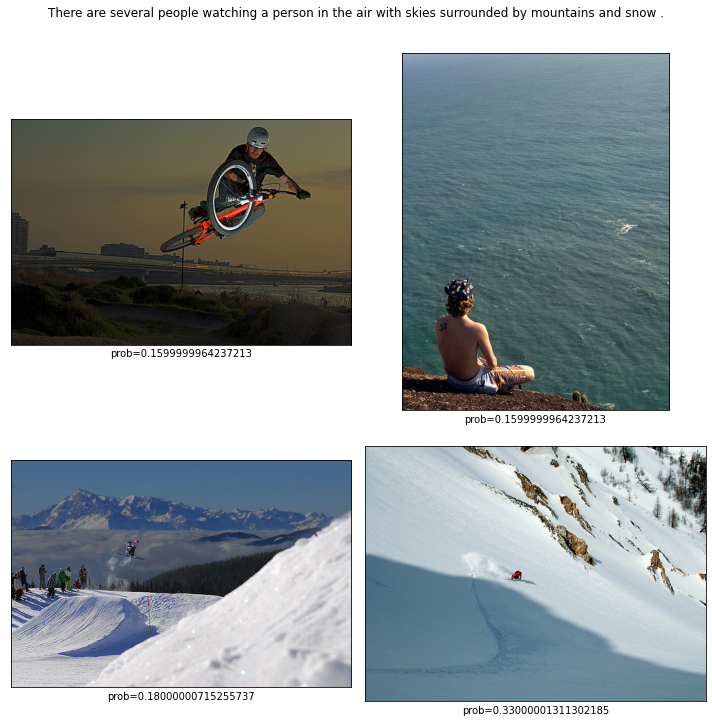

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_projector.weight', 'vocab_transform.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


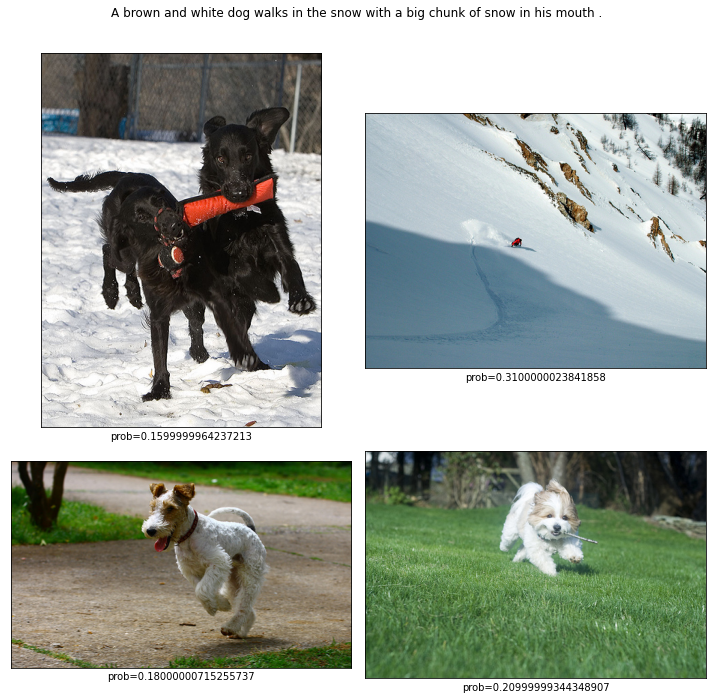

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_projector.weight', 'vocab_transform.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


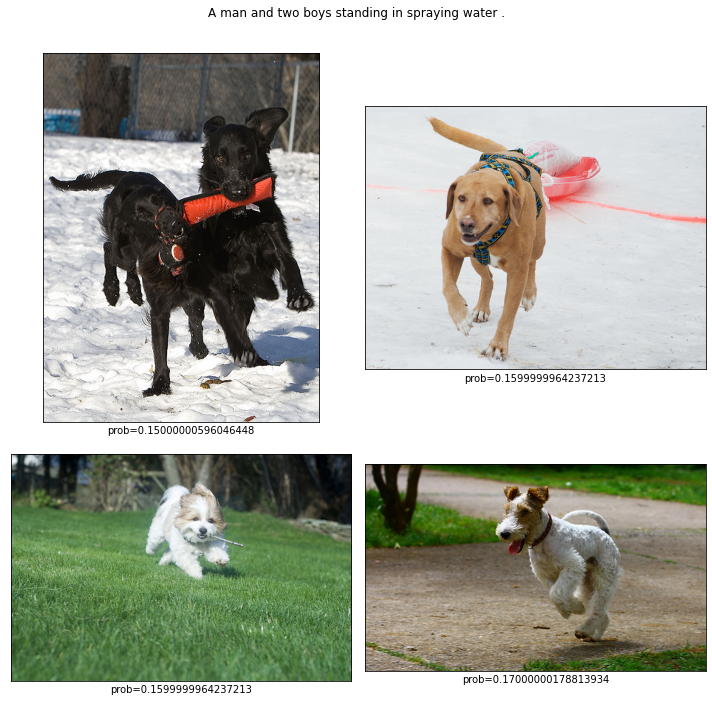

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_projector.weight', 'vocab_transform.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


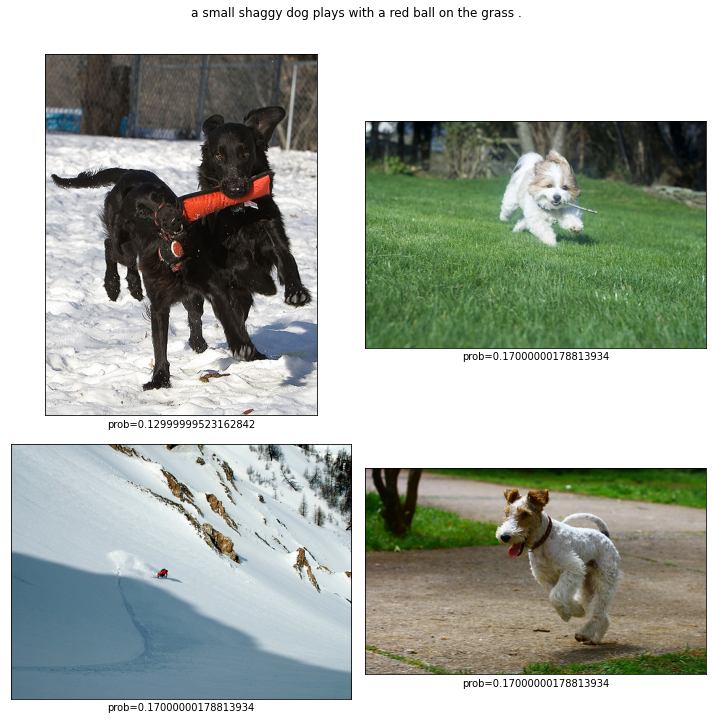

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_projector.weight', 'vocab_transform.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


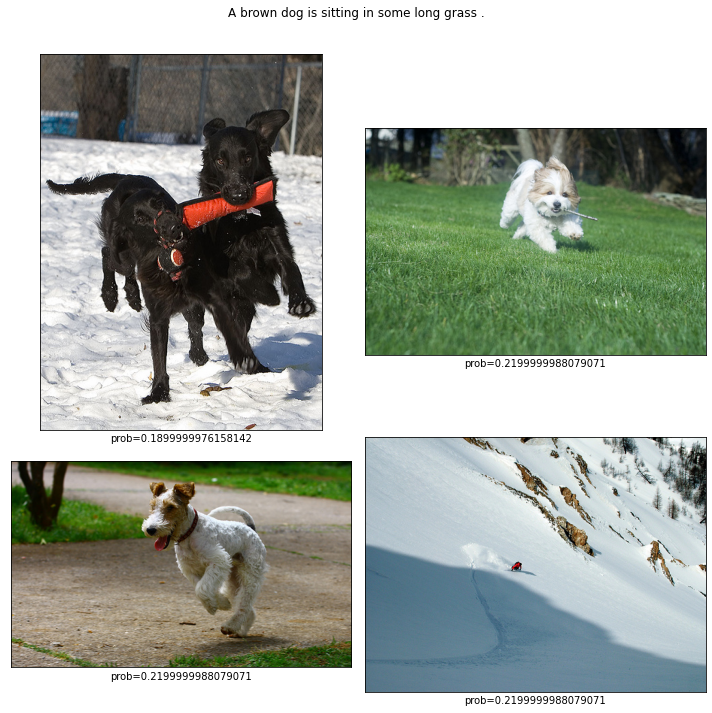

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_projector.weight', 'vocab_transform.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


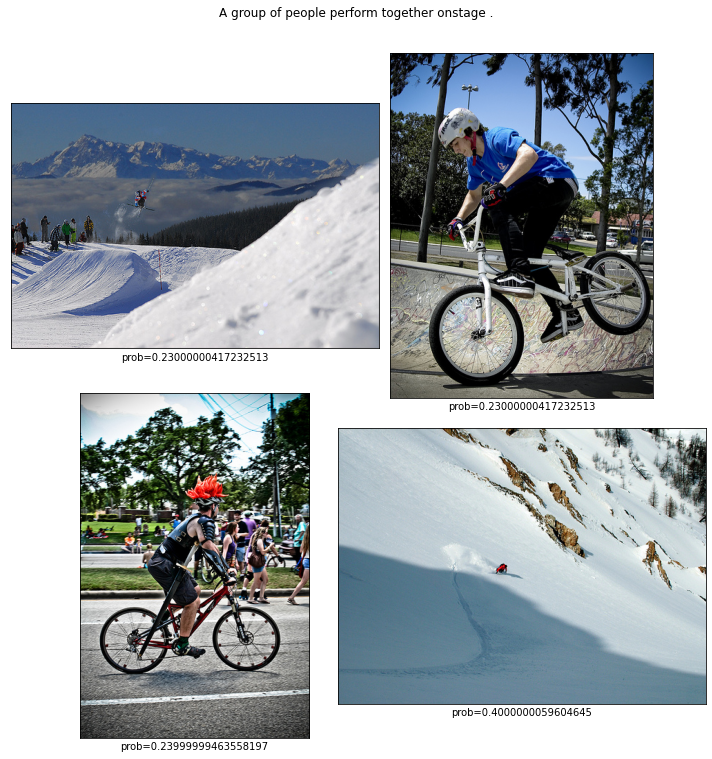

You asked for: I child slides into a wading pool full of water while an adult tosses a bucket of water on them .
This image is unavailable in your country in compliance with local laws.


Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertModel: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_projector.weight', 'vocab_transform.bias', 'vocab_layer_norm.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


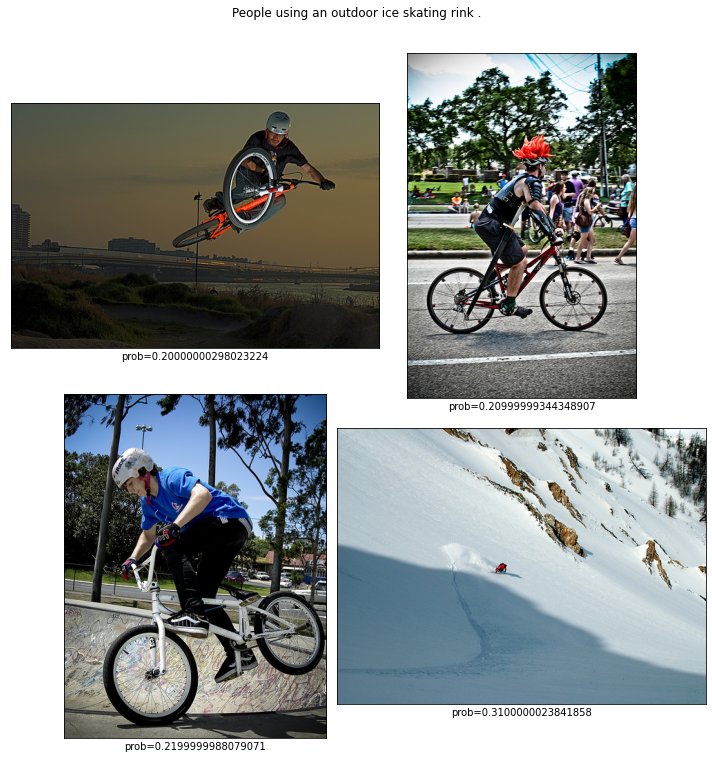

In [ ]:
for i in range(9):
    show_related_images(query=random_queries[0+i:1+i])

В целом, модель выдает изображения, на которых контекст схож с описанием, однако до идеала ей еще очень далеко. Один из способов, как можно было бы ее усовершенствовать - убедиться, что для каждого изоюражения (а также для каждого текстового описания) представлено одинаковое количество пар, отмеченных как "скорее совпадает" и "скорее не совпадает". Дисбаланс, при таком способе обучения, когда мы конкатенируем вектора, может спровоцировать тот факт, что модель начнет переобучаться под определенные изображения либо описания.

### 7.2 Пробуем альтернативу - модель Clip 2

In [ ]:
# Функция возвращает тензор, состоящий из тензоров предобработанных изображений
def images_to_tensor(image_names, data_set):
    """
    Open images and save them to the array
    """
    _, preprocess = clip.load("ViT-B/32", device=device)
    output_vectors = []
    images_names_list = image_names.values

    if data_set == 'train':
        folder = 'train_images'
    elif data_set == 'test':
        folder = 'test_images'

    for img_name in images_names_list:
        img = Image.open(f"{PATH}/{folder}/{img_name}")
        image = preprocess(Image.open(f"{PATH}/{folder}/{img_name}")).unsqueeze(0)
        output_vectors.append(image)
    return torch.cat(output_vectors)

In [ ]:
try:
    tensor_of_test_images = load_from_pkl('tensor_of_test_images')
except:
    tensor_of_test_images = images_to_tensor(image_names=test_images['image'], data_set='test')
    # save_to_pkl(tensor_of_test_images, 'tensor_of_test_images')

In [ ]:
# Функция выводит наиболее релевантные изображения по тектсовому запросу
def clip_show_related_images(query):
    text = query
    disclaimer = show_disclaimer(text.values[0], prohibit_wordlist)
    if not disclaimer:
        model, preprocess = clip.load("ViT-B/32", device=device)
        text_tokens = clip.tokenize(text).to(device)
        image = tensor_of_test_images.to(device)

        with torch.no_grad():        
            logits_per_image, logits_per_text = model(image, text_tokens)
            pred_probs = logits_per_text.softmax(dim=-1).cpu().numpy()[0]    

        # Получаем индексы четырех самых высоких вероятностей
        ind = np.argpartition(pred_probs, -4)[-4:][::-1]
        # Получаем четыре самые высокие вероятности
        top_probs = pred_probs[ind]
        # Получаем четыре изображения, для которых модель предсказала наиболее вероятное совпадение с текстом
        top_images = test_images.values[ind].flatten()

        # Выводим изображения на экран
        fig = plt.figure(figsize=(10,10))
        plt.suptitle(*text.values, y=1.05)
        for i in range(4):
            fig.add_subplot(2, 2, i+1)
            img_name = top_images[i]
            img_target = top_probs[i]
            img = mpimg.imread(f'{PATH}/test_images/{img_name}')
            plt.imshow(img)
            plt.xlabel(f'prob={round(img_target, 2)}')
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        plt.show()

You asked for: A boy plays basketball .
This image is unavailable in your country in compliance with local laws.


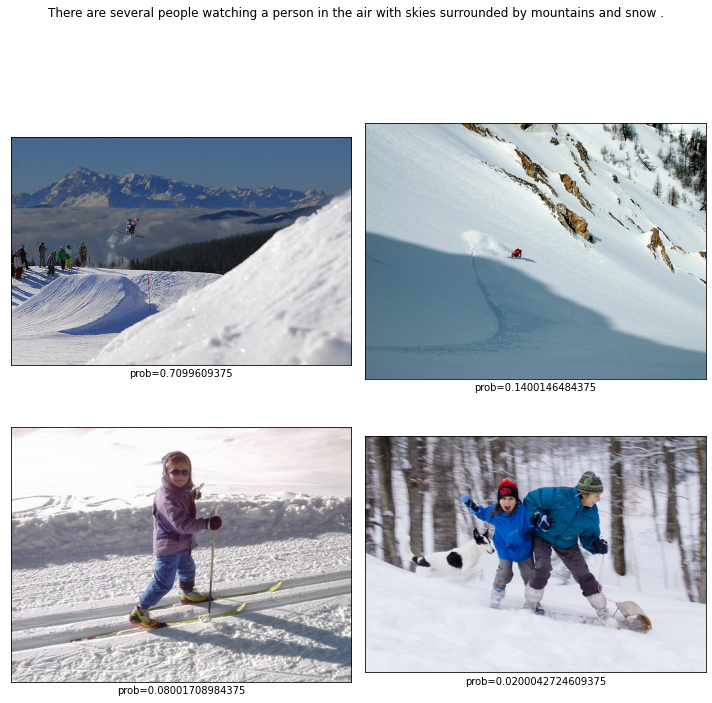

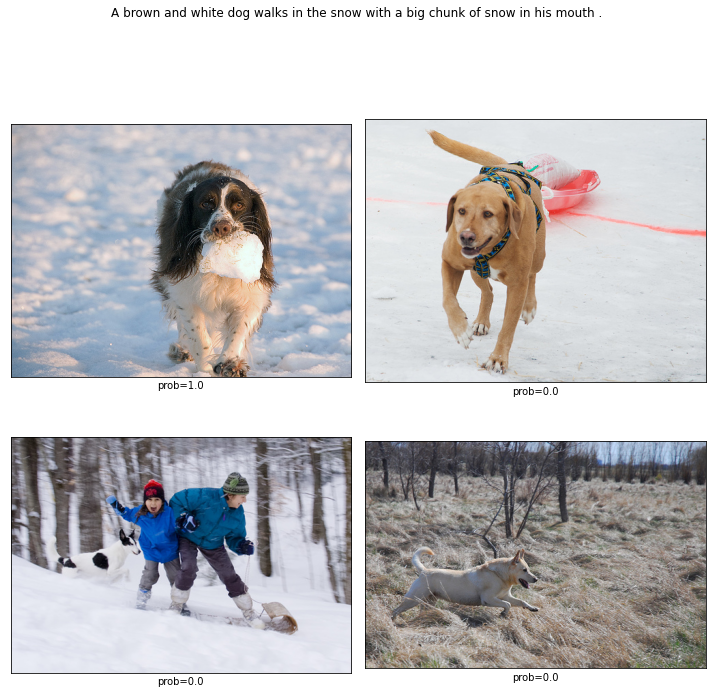

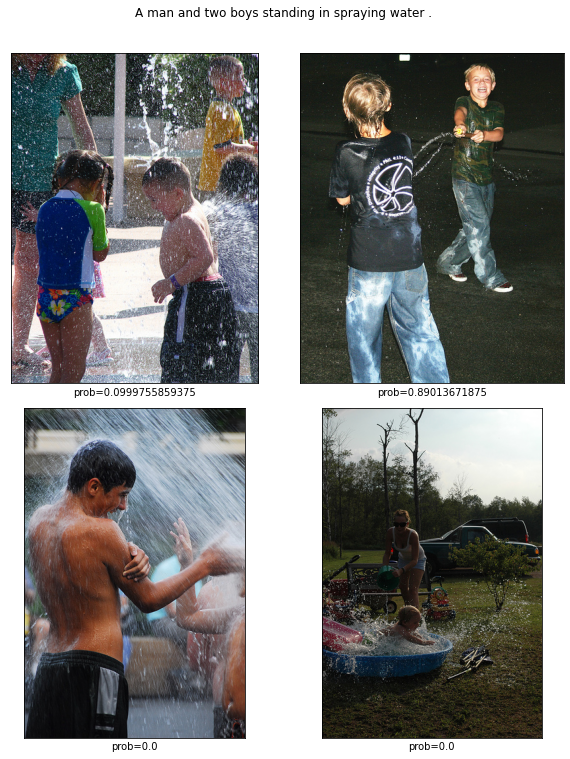

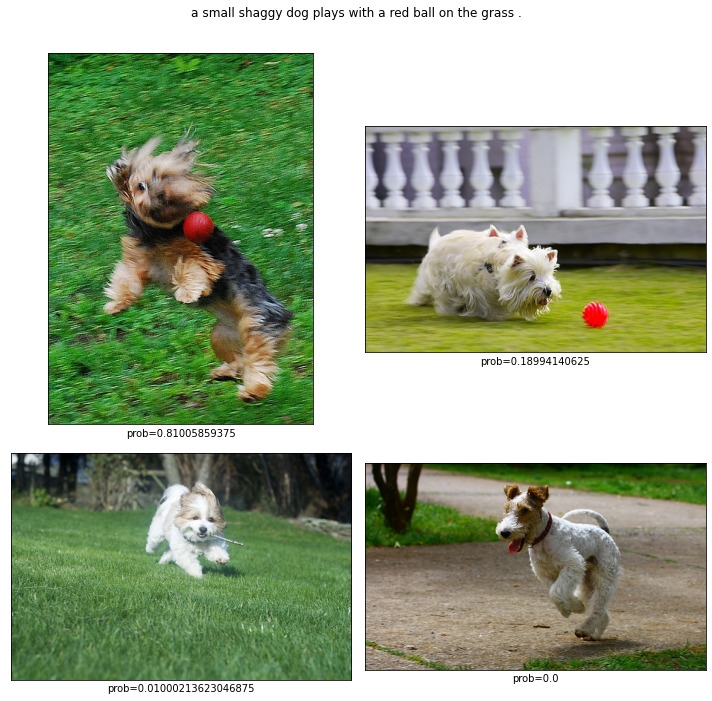

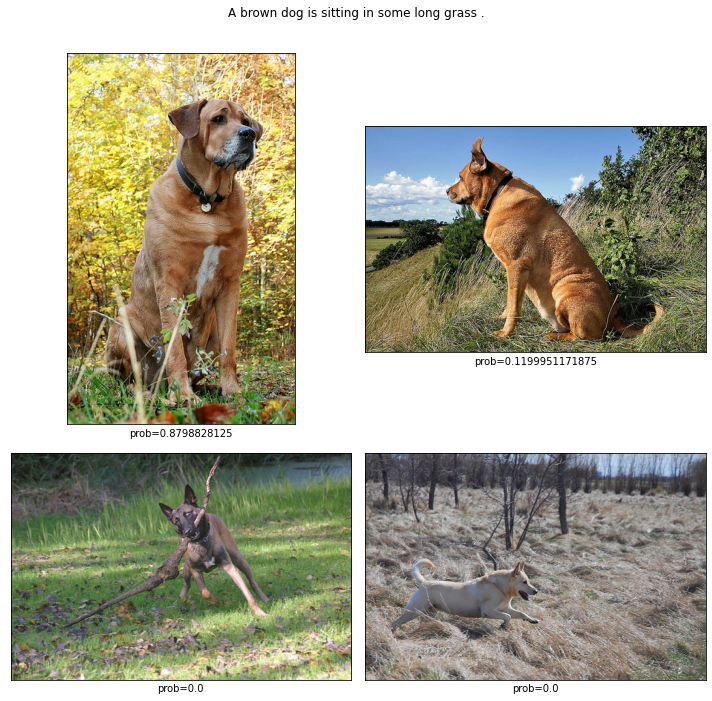

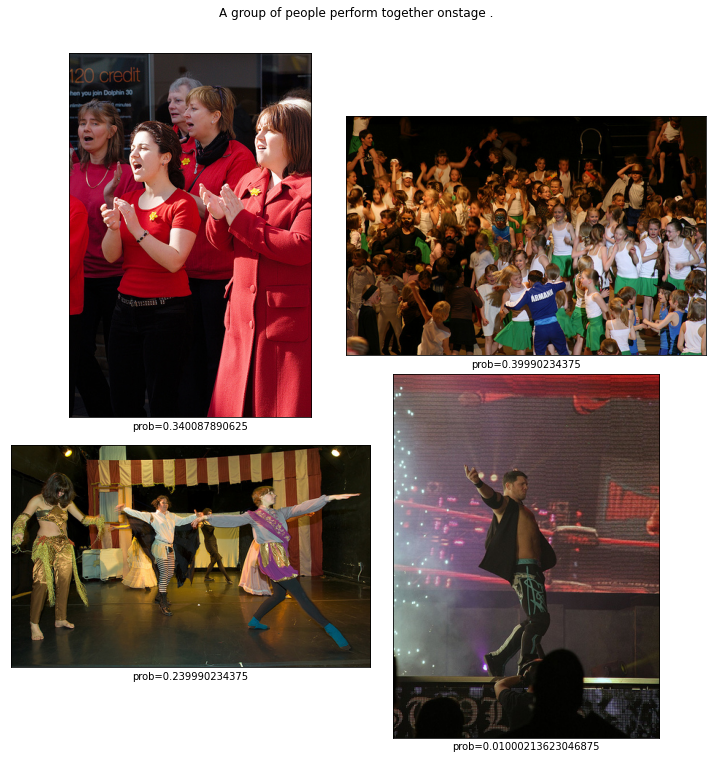

You asked for: I child slides into a wading pool full of water while an adult tosses a bucket of water on them .
This image is unavailable in your country in compliance with local laws.


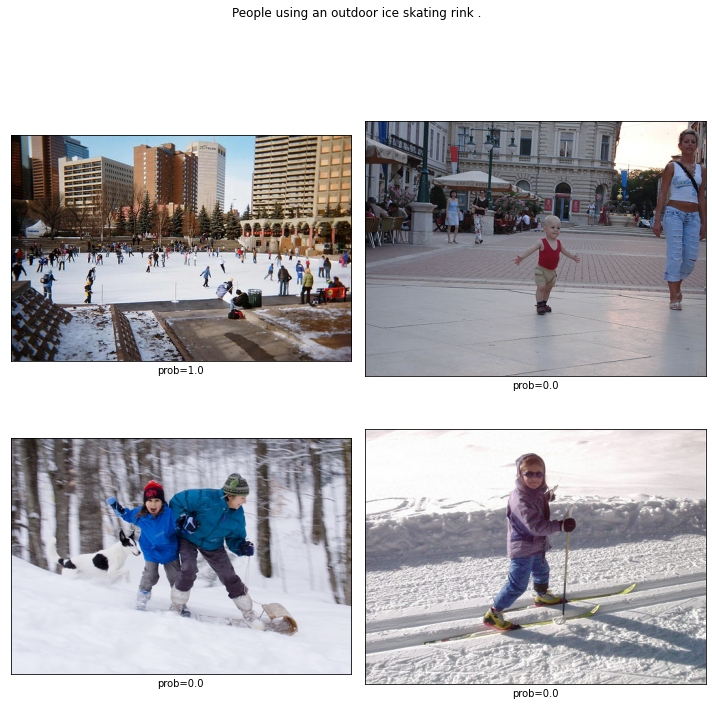

In [ ]:
for i in range(9):
    clip_show_related_images(query=random_queries[0+i:1+i])

Создавать отдельные эмбеддинги при помощи модели Clip2, конкатенировать их, и затем обучать на них какие-либо модели машинного обучения не имеет смысла, так как достаточно всего лишь найти косинусное расстояние между данными векторами. Между тем изображением и текстом данное расстояние будет наименьшим - между этими объектоами и будет существовать наиболее тесная смыслоовая связь.  
В этом легко убедиться. В качестве примера возьмем запрос:

In [ ]:
random_queries[6:7].values[0]

Логит, полученный из модели для наиболее вероятного изображения: 23.77
Вероятность наиболее вероятного изображения: 0.3962
Наибольшая вероятность сходства у изображения под индексом: 45
Наименьшее косинусное расстояние у изображения под индексом 45
Расстояние 0.716796875


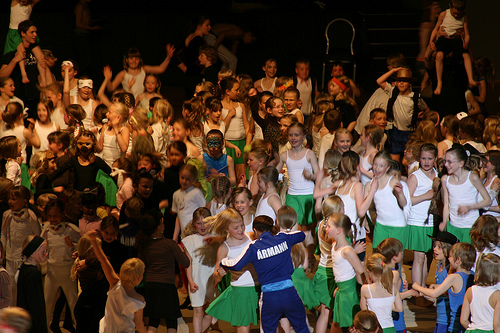

In [ ]:
model, preprocess = clip.load("ViT-B/32", device=device)

text = clip.tokenize('A group of people perform together onstage .').to(device)
image = tensor_of_test_images.to(device)

with torch.no_grad():
    # Получим вектора для изображений и текста
    image_features = model.encode_image(image)
    text_features = model.encode_text(text)

    # А также получим логиты непосредсвенное применив модель к изображениям и тексту
    logits_per_image, logits_per_text = model(image, text)
    probs = logits_per_text.softmax(dim=-1).cpu().numpy()[0]

print("Логит, полученный из модели для наиболее вероятного изображения:", logits_per_text.cpu().numpy()[0][np.argmax(np.argmax(probs))])
print("Вероятность наиболее вероятного изображения:", probs[np.argmax(probs)])
print('Наибольшая вероятность сходства у изображения под индексом:', np.argmax(probs))

# Для каждого вектора изображения найдем косинусное расстояние до веткора текста
cos_list  = []
for im in image_features.cpu().numpy():
    cos_list.append(cosine(im, text_features.cpu().numpy()))

print('Наименьшее косинусное расстояние у изображения под индексом', np.argmin(cos_list))
print('Косинусное расстояние', cos_list[np.argmin(cos_list)])
Image.open(f"{PATH}/test_images/{test_images['image'].values[np.argmax(probs)]}")

## 8. Выводы

Цель данной работы состояла в том, чтобы написать модель, способную по текстовому описанию подбирать наиболее релевантные изображения. 
Было принято решать задачу регрессии. Метрика качества - RMSE. Целевая переменная - вероятность схожести изображения и описания.  
Первым шагом оценки экспертов и краудсорсинга были аггрегированы и на их основе был сконструирован таргет - оценка схожести описания и изображения. Оценка лежит в диапазоне от нуля до единицы.  
Первоначально текстовые описания были векторизован при помощи модели BERT, а изображения - при помощи ResNet18. Результатом стали вектора следущей размерности:  
- Для одного описания: (768,)
- Для одного изображения: (25088,)  

Затем вектора были сконкатенированы. В результате признаковое пространство для одного объекта составило 25856 признаков.  

Была проверено качесвто работы линейной регрессии. Наилучший результат, который удалось получить с ее помощью - не отличался от качества константного предсказания.  

Следующим шагом была проверена работа нейронной сети. Качество, которое она показал после 5-и эпох обучения, показалось удовлетворительным - приблизительно 0.07 rmse. Однако при проверке на тестовых данных модель показала себя не лучшим образом. В целом, она выдавала изображения, на которых контекст схож с описанием, однако сходство было лишь отдаленное. Один из способов, как можно было бы усовершенствовать модель - убедиться, что для каждого изображения (а также для каждого текстового описания) представлено одинаковое количество пар, отмеченных как "скорее совпадает" и "скорее не совпадает". Дисбаланс, при таком способе обучения, когда мы конкатенируем вектора, может спровоцировать тот факт, что модель начнет переобучаться под определенные изображения либо описания.  
Иным способом усовершенствовать модель может служить иной способ подготовки данных для обучения. К примеру, не конкатенировать вектора, а использовать в качестве признака скалярное произведение данных векторов или иное.  

Затем было принято решение рассмотреть иную модель для создания эмбеддингов текста и изображения. Модель Clip2. Данная модель создает веткорное описание изображения и текста, размерностью 700 признаков для каждого объекта. Ее особенность заключается в том, как она предобрабаотывает данные. После такой предобработки, достаточно всего лишь найти косинунсное расстояние между веторами. У тех объектов, у которых между векторами текста и изображения расстояние будет наименьшим - скорее всего и будет наибольшее смысловое сходство.  

В качестве финальной модели было решено использовать модель Clip2.